## Setup environment

In [1]:
from swincell import utils

ModuleNotFoundError: No module named 'swincell'

In [2]:
import os
import json
import shutil
import tempfile
import time

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import nibabel as nib

from monai.losses import DiceLoss
from monai.inferers import sliding_window_inference
from monai import transforms
from monai.transforms import (
    AsDiscrete,
    Activations,
)

from monai.config import print_config
from monai.metrics import DiceMetric
from monai.utils.enums import MetricReduction
from monai.networks.nets import SwinUNETR
from monai import data
from monai.data import decollate_batch
from functools import partial

import torch


print_config()

In the future `np.bool` will be defined as the corresponding NumPy scalar.
In the future `np.bool` will be defined as the corresponding NumPy scalar.
In the future `np.bool` will be defined as the corresponding NumPy scalar.
In the future `np.bool` will be defined as the corresponding NumPy scalar.


MONAI version: 0.10.dev2225
Numpy version: 1.24.4
Pytorch version: 1.11.0
MONAI flags: HAS_EXT = False, USE_COMPILED = False
MONAI rev id: 6a2067a26b69aee6bcb4cf2b7adcda2c6e9adaed
MONAI __file__: /home/xzhang/anaconda3/envs/monai/lib/python3.9/site-packages/monai/__init__.py

Optional dependencies:
Pytorch Ignite version: 0.4.8
Nibabel version: 4.0.1
scikit-image version: 0.19.3
Pillow version: 9.0.1
Tensorboard version: 2.10.0
gdown version: 4.4.0
TorchVision version: 0.12.0
tqdm version: 4.64.0
lmdb version: 1.2.1
psutil version: 5.8.0
pandas version: 1.4.2
einops version: 0.4.1
transformers version: 4.18.0
mlflow version: 1.26.1
pynrrd version: 0.4.2

For details about installing the optional dependencies, please visit:
    https://docs.monai.io/en/latest/installation.html#installing-the-recommended-dependencies



## Setup data directory

You can specify a directory with the `MONAI_DATA_DIRECTORY` environment variable.  
This allows you to save results and reuse downloads.  
If not specified a temporary directory will be used.

# compare model performance

In [1]:
# show results
from natsort import natsorted
import tifffile 
import glob
import numpy as np
root_folder = '/data/download_data/quilt-data-access-tutorials-main/all_fov/allen100'
image_files = natsorted(glob.glob(root_folder + '/images/*.tiff'))
seg_files = natsorted(glob.glob(root_folder + '/masks/*.tiff'))
# print(seg_files)
valid_img_files = image_files[::5]
valid_seg_files = seg_files[::5]
# train_img_files = [f for i,f in enumerate(image_files) if i%5 != 0]
# train_seg_files = [f for i,f in enumerate(seg_files) if i%5 != 0]


# raw_img_folder = root_folder + '/images/[1,6].tiff'
#  before training 2d
results_2d_folder_algo1 = root_folder + '/results_2d_cellpose_algo1/*.tiff'
results_2d_folder_algo2 = root_folder + '/results_2d_cellpose_algo2/*.tiff'
# after training 2d
# choose the best threshold and diameter to compare with 3d cellpose
thre = 0.075
dia = 75
results_2d_folder_algo1_after_training = root_folder + '/results_2d_cellpose_algo1_after_training/*pred.tiff'
results_2d_folder_algo2_after_training = root_folder + '/results_2d_cellpose_algo2_after_training/*' + 'thre_' +str(thre)+ '_dia_' + str(dia) + '.tiff'

# after training 3d
results_3d_folder = root_folder + '/results_3d_monai_minsize50000/*.tiff'
# results_3d_folder = root_folder + '/results_3d_monai_minsize2500/*.tiff'

# Ground truth
# gt_folder = root_folder + '/masks/*.tiff'
gt_files = valid_seg_files


results_2d_files_algo1 = natsorted(glob.glob(results_2d_folder_algo1))
results_2d_files_algo2 = natsorted(glob.glob(results_2d_folder_algo2))

results_2d_files_algo1_after_training = natsorted(glob.glob(results_2d_folder_algo1_after_training))
results_2d_files_algo2_after_training = natsorted(glob.glob(results_2d_folder_algo2_after_training))


# results_3d_files = natsorted(glob.glob(results_3d_folder))[::5]
results_3d_files = natsorted(glob.glob(results_3d_folder))

raw_image_files = valid_img_files
# print(results_2d_files_algo1,results_2d_files_algo2,results_3d_files,gt_files)
print(len(raw_image_files),len(results_2d_files_algo1),len(results_3d_files),len(gt_files),len(results_2d_files_algo1_after_training),len(results_2d_files_algo2_after_training))

20 20 20 20 20 20


# calculate new results

In [4]:
from stardist_matching import matching
import pandas as pd
N_thresholds =15
mAP_2d_algo1_list =np.zeros((len(results_2d_files_algo1),N_thresholds))
mAP_2d_algo2_list =np.zeros((len(results_2d_files_algo2),N_thresholds))
mAP_2d_algo1_after_training_list =np.zeros((len(results_2d_files_algo1_after_training),N_thresholds))
mAP_2d_algo2_after_training_list =np.zeros((len(results_2d_files_algo2_after_training),N_thresholds))
mAP_3d_list =np.zeros((len(results_3d_files),N_thresholds))
output = pd.DataFrame()
for i in range(len(results_2d_files_algo1)):
    for idxt,threshold in enumerate(np.linspace(0.5,1,N_thresholds)):
    # threshold = 0.5
        gt_img = tifffile.imread(gt_files[i])
        # results 3d
        img_3d = tifffile.imread(results_3d_files[i])
        # results 2d
        img_2d_algo1 = tifffile.imread(results_2d_files_algo1[i])
        img_2d_algo2 = tifffile.imread(results_2d_files_algo2[i])  
        img_2d_algo1_after_training = tifffile.imread(results_2d_files_algo1_after_training[i])
        img_2d_algo2_after_training = tifffile.imread(results_2d_files_algo2_after_training[i])  

        # mAP_3d = matching(img_3d, gt_img, thresh=threshold).precision
        # mAP_2d_algo1 = matching(img_2d_algo1, gt_img, thresh=threshold).precision
        # mAP_2d_algo2 = matching(img_2d_algo2, gt_img, thresh=threshold).precision
        # mAP_2d_algo1_after_training = matching(img_2d_algo1_after_training, gt_img, thresh=threshold).precision
        # mAP_2d_algo2_after_training = matching(img_2d_algo2_after_training, gt_img, thresh=threshold).precision
        mAP_3d = matching(gt_img,img_3d,  thresh=threshold)
        mAP_2d_algo1 = matching(gt_img,img_2d_algo1, thresh=threshold)
        mAP_2d_algo2 = matching(gt_img,img_2d_algo2, thresh=threshold)
        mAP_2d_algo1_after_training = matching(gt_img,img_2d_algo1_after_training, thresh=threshold)
        mAP_2d_algo2_after_training = matching(gt_img,img_2d_algo2_after_training, thresh=threshold)

        df_temp = pd.DataFrame([mAP_3d])
        df_temp['img_id'] = str(gt_files[i].split('/')[-1])
        df_temp['method'] = 'swincell'
        output = pd.concat([output,df_temp])

        df_temp = pd.DataFrame([mAP_2d_algo1])
        df_temp['img_id'] = str(gt_files[i].split('/')[-1])
        df_temp['method'] = '2d cellpose algo1'
        output = pd.concat([output,df_temp])

        df_temp = pd.DataFrame([mAP_2d_algo2])
        df_temp['img_id'] = str(gt_files[i].split('/')[-1])
        df_temp['method'] = '2d cellpose algo2'
        output = pd.concat([output,df_temp])

        df_temp = pd.DataFrame([mAP_2d_algo1_after_training])
        df_temp['img_id'] = str(gt_files[i].split('/')[-1])
        df_temp['method'] = '2d cellpose algo1 after training'
        output = pd.concat([output,df_temp])

        df_temp = pd.DataFrame([mAP_2d_algo2_after_training])
        df_temp['img_id'] = str(gt_files[i].split('/')[-1])
        df_temp['method'] = '2d cellpose algo2 after training'
        output = pd.concat([output,df_temp])

        # mAP_2d_algo1_list[i,idxt] = mAP_2d_algo1.precision
        # mAP_2d_algo2_list[i,idxt] = mAP_2d_algo2.precision
        # mAP_2d_algo1_after_training_list[i,idxt] = mAP_2d_algo1_after_training.precision
        # mAP_2d_algo2_after_training_list[i,idxt] = mAP_2d_algo2_after_training.precision
        # mAP_3d_list[i,idxt] = mAP_3d.precision


    
        # print(mAP_3d,mAP_2d_algo1,mAP_2d_algo2,mAP_2d_algo1_after_training,mAP_2d_algo2_after_training,'\n')
print(output.head(20))

KeyboardInterrupt: 

In [18]:
# write calculated results into a csv file
# output.head(20)
# output.to_csv('./output_Allen_15steps_new.csv')

In [6]:
# calculate volumes and diameter
from utils.utils import calculate_cell_diameters,calculate_cell_volumes
from utils.utils import plot_box_with_violin
import pandas as pd
N_thresholds =5
mAP_2d_algo1_list =np.zeros((len(results_2d_files_algo1),N_thresholds))
mAP_2d_algo2_list =np.zeros((len(results_2d_files_algo2),N_thresholds))
mAP_2d_algo1_after_training_list =np.zeros((len(results_2d_files_algo1_after_training),N_thresholds))
mAP_2d_algo2_after_training_list =np.zeros((len(results_2d_files_algo2_after_training),N_thresholds))
mAP_3d_list =np.zeros((len(results_3d_files),N_thresholds))
output = pd.DataFrame()
dia_gt_res = []
dia_swincell_res = []
dia_algo1_res = []
dia_algo2_res = []
dia_algo1_after_training_res = []
dia_algo2_after_training_res = []

vol_gt_res =[]
vol_swincell_res = []
vol_algo1_res = []
vol_algo2_res = []
vol_algo1_after_training_res = []
vol_algo2_after_training_res = []
for i in range(len(results_2d_files_algo1)):

    img_gt = tifffile.imread(gt_files[i])
    # results 3d
    img_3d = tifffile.imread(results_3d_files[i])
    # results 2d
    img_2d_algo1 = tifffile.imread(results_2d_files_algo1[i])
    img_2d_algo2 = tifffile.imread(results_2d_files_algo2[i])  
    img_2d_algo1_after_training = tifffile.imread(results_2d_files_algo1_after_training[i])
    img_2d_algo2_after_training = tifffile.imread(results_2d_files_algo2_after_training[i])  

    dia_gt = calculate_cell_diameters(img_gt)
    dia_swincell = calculate_cell_diameters(img_3d)
    dia_algo1 = calculate_cell_diameters(img_2d_algo1)
    dia_algo2 = calculate_cell_diameters(img_2d_algo2)
    dia_algo1_after_training = calculate_cell_diameters(img_2d_algo1_after_training)
    dia_algo2_after_training = calculate_cell_diameters(img_2d_algo2_after_training)
    
    dia_gt_res.extend(dia_gt)
    dia_swincell_res.extend(dia_swincell)
    dia_algo1_res.extend(dia_algo1)
    dia_algo2_res.extend(dia_algo2)
    dia_algo1_after_training_res.extend(dia_algo1_after_training)
    dia_algo2_after_training_res.extend(dia_algo2_after_training)

    # dia_2d_algo1 = calculate_cell_diameters(img_2d_algo1)

    vol_gt = calculate_cell_volumes(img_gt)
    vol_swincell = calculate_cell_volumes(img_3d)
    vol_algo1 = calculate_cell_volumes(img_2d_algo1)
    vol_algo2 = calculate_cell_volumes(img_2d_algo2)
    vol_algo1_after_training = calculate_cell_volumes(img_2d_algo1_after_training)
    vol_algo2_after_training = calculate_cell_volumes(img_2d_algo2_after_training)

    vol_gt_res.extend(vol_gt)
    vol_swincell_res.extend(vol_swincell)
    vol_algo1_res.extend(vol_algo1)
    vol_algo2_res.extend(vol_algo2)
    vol_algo1_after_training_res.extend(vol_algo1_after_training)
    vol_algo2_after_training_res.extend(vol_algo2_after_training)





In [17]:
# print(dia_gt)
print(min(vol_gt_res),max(vol_gt_res))
print(len(dia_gt_res))
# print(len(dia_gt))
# res_gt= []

15231 295661
718


[(0.51, 0.7, 0.8), (0.631, 0.466, 0.706), (0.95294118, 0.43137255, 0.25882353), (0.35294118, 0.43137255, 0.75882353)]


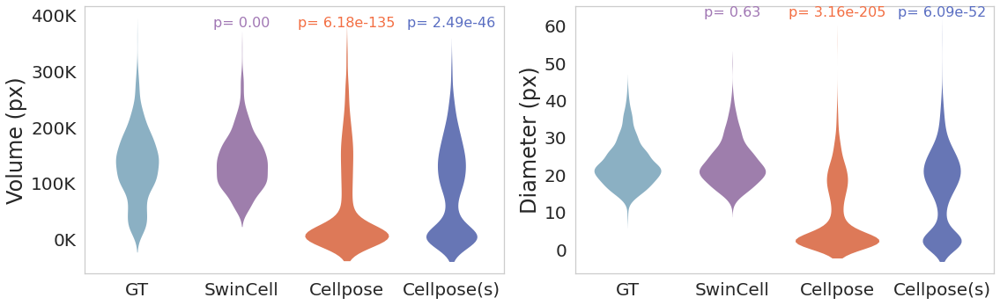

In [7]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu,ks_2samp


factor= 1
factor2 = 1
# colors =[[(factor*0.75,factor*0.882,factor*0.867),(factor*0.855,factor*0.765,factor*0.847)],
#          [(factor*0.51,factor*0.7,factor*0.8),(factor*0.631,factor*0.466,factor*0.706)]
#          ]
# colors =[[(factor*0.75,factor*0.882,factor*0.867),(factor*0.855,factor*0.765,factor*0.847),(factor2*0.95294118, factor2*0.43137255, factor2*0.25882353)],
#          [(factor*0.51,factor*0.7,factor*0.8),(factor*0.631,factor*0.466,factor*0.706),(0.95294118, 0.43137255, 0.25882353)],
#          ]
colors =[[(factor*0.75,factor*0.882,factor*0.867),(factor*0.855,factor*0.765,factor*0.847),(factor2*0.95294118, factor2*0.43137255, factor2*0.25882353),(factor2*0.35294118, factor2*0.43137255, factor2*0.75882353)],
         [(factor*0.51,factor*0.7,factor*0.8),(factor*0.631,factor*0.466,factor*0.706),(0.95294118, 0.43137255, 0.25882353),(0.35294118, 0.43137255, 0.75882353)],
         ]
# colors
print(colors[1])
# Combine the volume data and create group labels
# all_volumes = np.concatenate([vol_gt, vol_seg])
all_volumes = np.concatenate([vol_gt_res, vol_swincell_res,vol_algo2_res,vol_algo2_after_training_res])
all_diameters = np.concatenate([dia_gt_res, dia_swincell_res,dia_algo2_res,dia_algo2_after_training_res])
volume_labels = ['GT'] * len(vol_gt_res) + ['SwinCell'] * len(vol_swincell_res) + ['Cellpose'] * len(vol_algo2_res)  + ['Cellpose(s)'] * len(vol_algo2_after_training_res)
diameter_labels = ['GT'] * len(dia_gt_res) + ['SwinCell'] * len(dia_swincell_res) + ['Cellpose'] * len(dia_algo2_res) + ['Cellpose(s)'] * len(dia_algo2_after_training_res)
# Perform Mann-Whitney U test
# statistic, p_value_vol = mannwhitneyu(vol_gt, vol_seg, alternative='two-sided')
# statistic, p_value_dia = mannwhitneyu(dia_gt, dia_seg, alternative='two-sided')
# Perform KS test
statistic, p_value_vol_3d = ks_2samp(vol_gt_res, vol_swincell_res)
statistic, p_value_dia_3d = ks_2samp(dia_gt_res, dia_swincell_res)

statistic, p_value_vol_2d = ks_2samp(vol_gt_res, vol_algo2_res)
statistic, p_value_dia_2d = ks_2samp(dia_gt_res, dia_algo2_res)

statistic, p_value_vol_2ds = ks_2samp(vol_gt_res, vol_algo2_after_training_res)
statistic, p_value_dia_2ds = ks_2samp(dia_gt_res, dia_algo2_after_training_res)

# Set up Seaborn style
sns.set(style='whitegrid')

# Create a figure with a violin plot using Seaborn
plt.figure(figsize=(16, 5))
plt.subplot(1, 2, 1)

sns.violinplot(x=volume_labels, y=all_volumes, inner=None, palette=colors[1],linewidth=0)
# sns.swarmplot(x=volume_labels, y=all_volumes, palette=colors[1], size=3)

# Annotate the plot with the p-value in scientific notation
# plt.text(1, 1.05*np.max(all_volumes), f'p= {p_value_vol_3d:.2e}', horizontalalignment='center', fontsize=16, color='black')
plt.text(1, 1.05*np.max(all_volumes), f'p= {p_value_vol_3d:.2f}', horizontalalignment='center', fontsize=16, color=colors[1][1])
plt.text(2, 1.05*np.max(all_volumes), f'p= {p_value_vol_2d:.2e}', horizontalalignment='center', fontsize=16, color=colors[1][2])
plt.text(3, 1.05*np.max(all_volumes), f'p= {p_value_vol_2ds:.2e}', horizontalalignment='center', fontsize=16, color=colors[1][3])
# Set plot title and labels
# plt.title('Comparison of Volume Distributions', fontsize=24)
# plt.xlabel('Groups', fontsize=18)
# plt.ylabel('Volume (px)', fontsize=24)

from matplotlib.ticker import FuncFormatter
ax1 = plt.gca()
ax1.yaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{int(x/1000):,}K'))

plt.ylabel('Volume (px)', fontsize=24)


# Set tick label font size
plt.grid(False)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.subplot(1, 2, 2)
sns.violinplot(x=diameter_labels, y=all_diameters, inner=None, palette=colors[1],linewidth=0)
# sns.swarmplot(x=diameter_labels, y=all_diameters, palette=colors[1], size=3)

# plt.text(1, 1.1*np.max(all_diameters), f'p= {p_value_dia_3d:.2e}', horizontalalignment='center', fontsize=16, color='black')
plt.text(1, 1.1*np.max(all_diameters), f'p= {p_value_dia_3d:.2f}', horizontalalignment='center', fontsize=16, color=colors[1][1])
plt.text(2, 1.1*np.max(all_diameters), f'p= {p_value_dia_2d:.2e}', horizontalalignment='center', fontsize=16, color=colors[1][2])
plt.text(3, 1.1*np.max(all_diameters), f'p= {p_value_dia_2ds:.2e}', horizontalalignment='center', fontsize=16, color=colors[1][3])
# # Set plot title and labels
# # plt.title('Comparison of Volume Distributions', fontsize=24)
# plt.xlabel('Groups', fontsize=18)
plt.ylabel('Diameter (px)', fontsize=24)

# # Set tick label font size
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)


# Adjust layout and save the plot
plt.tight_layout()
plt.grid(False)
# Show the plot or save it as an image
plt.show()


In [2]:
ls

Fig1_workflow.ipynb
Fig2_colon_dataset.ipynb
Fig3_Allen_dataset_compare_model_performance.ipynb
Fig_4_5_for_nanolive_figure_model_performance_withCellpose.ipynb
Fig_S4_nanolive_figure_model_performance_Appendix.ipynb


## load previous results

In [4]:
# output.to_csv('./output_10steps_test_after_datacleaning.csv')
# output_3d= output[output['method']=='3d cellpose']

# load precomputed results or calculate them-------------------------------
import pandas as pd
import numpy as np
N_thresholds = 15
output = pd.read_csv('../../results/output_Allen_15steps_1.csv') # load precomputed results
# output = pd.read_csv('./output_Allen_15steps_new.csv') # load precomputed results
#---------------------------------------------------


# output_3d= output[output['method']=='2d cellpose algo2 after training']
output_3d= output[output['method']=='swincell']
# output_3d= output[output['method']=='3d cellpose']
# stat =output_3d.groupby(['img_id']).mean()
# stat.head(20)
# output.replace('3d cellpose','swincell',inplace=True)
# output.to_csv('./output_Allen_15steps_1.csv')


In [5]:
output_3d= output[output['method']=='swincell']
# output_3d= output[output['method']=='3d cellpose']
output_2d_algo1= output[output['method']=='2d cellpose algo1']
output_2d_algo2= output[output['method']=='2d cellpose algo2']
output_2d_algo1_after_training= output[output['method']=='2d cellpose algo1 after training']
output_2d_algo2_after_training= output[output['method']=='2d cellpose algo2 after training']

mAP_3d_list =output_3d['precision'].values.reshape(20,N_thresholds)
mAP_2d_algo1_list =output_2d_algo1['precision'].values.reshape(20,N_thresholds)
mAP_2d_algo2_list =output_2d_algo2['precision'].values.reshape(20,N_thresholds)
mAP_2d_algo1_after_training_list =output_2d_algo1_after_training['precision'].values.reshape(20,N_thresholds)
mAP_2d_algo2_after_training_list =output_2d_algo2_after_training['precision'].values.reshape(20,N_thresholds)

output_3d.head(10)

,Unnamed: 0,Unnamed: 0.1,criterion,thresh,fp,tp,fn,precision,recall,accuracy,f1,n_true,n_pred,mean_true_score,mean_matched_score,panoptic_quality,img_id,method
0,0,0,iou,0.500000,1,33,8,0.970588,0.804878,0.785714,0.880000,41,34,0.737124,0.915821,0.805922,1.tiff,swincell
5,5,0,iou,0.535714,1,33,8,0.970588,0.804878,0.785714,0.880000,41,34,0.737124,0.915821,0.805922,1.tiff,swincell
10,10,0,iou,0.571429,1,33,8,0.970588,0.804878,0.785714,0.880000,41,34,0.737124,0.915821,0.805922,1.tiff,swincell
15,15,0,iou,0.607143,1,33,8,0.970588,0.804878,0.785714,0.880000,41,34,0.737124,0.915821,0.805922,1.tiff,swincell
20,20,0,iou,0.642857,2,32,9,0.941176,0.780488,0.744186,0.853333,41,34,0.721599,0.924549,0.788949,1.tiff,swincell
25,25,0,iou,0.678571,3,31,10,0.911765,0.756098,0.704545,0.826667,41,34,0.705473,0.933045,0.771317,1.tiff,swincell
30,30,0,iou,0.714286,3,31,10,0.911765,0.756098,0.704545,0.826667,41,34,0.705473,0.933045,0.771317,1.tiff,swincell
35,35,0,iou,0.750000,3,31,10,0.911765,0.756098,0.704545,0.826667,41,34,0.705473,0.933045,0.771317,1.tiff,swincell
40,40,0,iou,0.785714,4,30,11,0.882353,0.731707,0.666667,0.800000,41,34,0.687036,0.938949,0.751159,1.tiff,swincell
45,45,0,iou,0.821429,4,30,11,0.882353,0.731707,0.666667,0.800000,41,34,0.687036,0.938949,0.751159,1.tiff,swincell


In [8]:
f1_3d_list =output_3d['f1'].values.reshape(20,N_thresholds)  # 20 is the Number of samples (20% used for testing), N_thresholds =15 or 5
f1_2d_algo1_list =output_2d_algo1['f1'].values.reshape(20,N_thresholds)
f1_2d_algo2_list =output_2d_algo2['f1'].values.reshape(20,N_thresholds)
f1_2d_algo1_after_training_list =output_2d_algo1_after_training['f1'].values.reshape(20,N_thresholds)
f1_2d_algo2_after_training_list =output_2d_algo2_after_training['f1'].values.reshape(20,N_thresholds)

precision_3d_list =output_3d['precision'].values.reshape(20,N_thresholds)  # 20 is the Number of samples (20% used for testing), N_thresholds =15 or 5
precision_2d_algo1_list =output_2d_algo1['precision'].values.reshape(20,N_thresholds)
precision_2d_algo2_list =output_2d_algo2['precision'].values.reshape(20,N_thresholds)
precision_2d_algo1_after_training_list =output_2d_algo1_after_training['precision'].values.reshape(20,N_thresholds)
precision_2d_algo2_after_training_list =output_2d_algo2_after_training['precision'].values.reshape(20,N_thresholds)

recall_3d_list =output_3d['recall'].values.reshape(20,N_thresholds)  # 20 is the Number of samples (20% used for testing), N_thresholds =15 or 5
recall_2d_algo1_list =output_2d_algo1['recall'].values.reshape(20,N_thresholds)
recall_2d_algo2_list =output_2d_algo2['recall'].values.reshape(20,N_thresholds)
recall_2d_algo1_after_training_list =output_2d_algo1_after_training['recall'].values.reshape(20,N_thresholds)
recall_2d_algo2_after_training_list =output_2d_algo2_after_training['recall'].values.reshape(20,N_thresholds)

# print(f1_3d_list)
# print(f1_2d_algo2_after_training_list)
# print(f1_3d_list[:,0].shape)  #
# thresholds = np.linspace(0.5,1,N_thresholds)
# print(thresholds)
mean_f1_at_thre05 = f1_3d_list[:,0].mean()
mAP_at_thre05 = precision_3d_list[:,0].mean()
recall_at_thre05 = recall_3d_list[:,0].mean()
print(mean_f1_at_thre05, mAP_at_thre05, recall_at_thre05)


0.8257335345672623 0.9514357263809787 0.7586472683083041


In [6]:
print(mAP_3d_list.shape,mAP_2d_algo1_list.shape,mAP_2d_algo2_list.shape,mAP_2d_algo1_after_training_list.shape,mAP_2d_algo2_after_training_list.shape)

(20, 15) (20, 15) (20, 15) (20, 15) (20, 15)


(20, 15)


[Text(1, 0, 'SwinCell'),
 Text(2, 0, 'Cellpose v1'),
 Text(3, 0, 'Cellpose v2'),
 Text(4, 0, 'V1 finetuned'),
 Text(5, 0, 'V2 finetuned')]

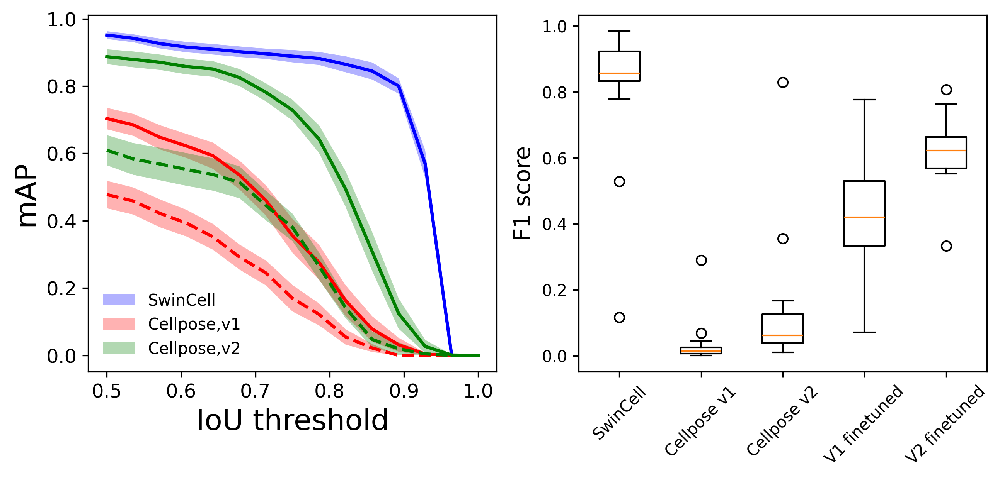

In [9]:
from matplotlib import pyplot as plt
from swincell.utils.utils import plot_with_se,plot_box_with_violin
iou_thresholds = np.linspace(0.5,1,N_thresholds)
# fig,ax = plt.subplots(1,2,figsize=(12,4), dpi=300)
fig,ax = plt.subplots(1,2,figsize=(10,4), dpi=300)
# ax[0].plot(iou_thresholds,map_3d_mean,linewidth=2,label='3D cellpose')
# ax.fill_between(iou_thresholds,map_3d_mean-map_3d_se,map_3d_mean+map_3d_se,alpha=0.3,label='3D cellpose')
# def plot_with_se(ax,matrix,label=None,style='-',color=None):
#     mean = np.mean(matrix, axis=0)
#     std = np.std(matrix, axis=0)
#     se = std / np.sqrt(matrix.shape[0])
#     ax.plot(iou_thresholds,mean,linewidth=2,linestyle=style,color=color)
#     ax.fill_between(iou_thresholds,mean-se,mean+se,alpha=0.3,label=label,color=color)
#     return ax

plot_with_se(ax[0],mAP_3d_list,iou_thresholds,label='SwinCell',color='blue')
plot_with_se(ax[0],mAP_2d_algo1_list,iou_thresholds,style='--',color='red')
# plot_with_se(ax[0],mAP_2d_algo1_after_training_list,label='2D cellpose,v1, finetuned')
plot_with_se(ax[0],mAP_2d_algo1_after_training_list,iou_thresholds,label='Cellpose,v1', color='red')
plot_with_se(ax[0],mAP_2d_algo2_list,iou_thresholds,style='--',color='green')
# plot_with_se(ax[0],mAP_2d_algo2_after_training_list,label='2D cellpose,v2, finetuned')
plot_with_se(ax[0],mAP_2d_algo2_after_training_list,iou_thresholds,label='Cellpose,v2',color='green')
ax[0].legend(loc='lower left',frameon=False,fontsize=10)
ax[0].tick_params(labelsize=12)
ax[0].set_ylabel('mAP',fontsize =18)
ax[0].set_xlabel('IoU threshold',fontsize =18)

# add new legend
# lines = ax.get_lines()
# legend1 = plt.legend([lines[i] for i in [1,0]], ["pretrained", "finetuned"], loc=1)
# plt.gca().add_artist(legend1)

# F1 score barplot
x_pos =np.arange(2,7) 

print(f1_3d_list.shape)  # size =(Num_testImages, N_thresholds) or (20 * 15)
f1_means = [np.mean(f1_3d_list[:,0],axis=0),np.mean(f1_2d_algo1_list[:,0],axis=0),np.mean(f1_2d_algo2_list[:,0],axis=0),np.mean(f1_2d_algo1_after_training_list[:,0],axis=0),np.mean(f1_2d_algo2_after_training_list[:,0],axis=0)]
f1_se = [np.std(f1_3d_list[:,0],axis=0),np.std(f1_2d_algo1_list[:,0],axis=0),np.std(f1_2d_algo2_list[:,0],axis=0),np.std(f1_2d_algo1_after_training_list[:,0],axis=0),np.std(f1_2d_algo2_after_training_list[:,0],axis=0)]/np.sqrt(f1_2d_algo1_list.shape[0])
# ax[0][1].bar(x_pos, f1_means, yerr=f1_se, align='center', alpha=0.5, ecolor='black', capsize=10)
# # ax[0][1].set_xlabel('test')
# ax[0][1].set_xticks([xlabel])
# # ax[0][1].set_xticks([x_pos], xlabel)
# ax[0][1].set_ylim(0,1)
columns = [f1_3d_list[:,0],f1_2d_algo1_list[:,0],f1_2d_algo1_after_training_list[:,0],f1_2d_algo2_list[:,0],f1_2d_algo2_after_training_list[:,0]]

ax[1].boxplot(columns)
# ax[1].set_xticks([1, 2, 3, 4,5], ['3D','2D_v1','2D_v2','2D_v1_after_training','2D_v2_after_training'])
# ax[1].set_xticklabels(['Unet', 'SwinUnetr'],fontsize =16)

ax[1].set_ylabel('F1 score',fontsize =14)
ax[1].set_xticklabels(['SwinCell','Cellpose v1','Cellpose v2','V1 finetuned','V2 finetuned'],fontsize =10,rotation=45)




[Text(1, 0, 'SwinCell'),
 Text(2, 0, 'Cellpose v1'),
 Text(3, 0, 'Cellpose v2'),
 Text(4, 0, 'V1 finetuned'),
 Text(5, 0, 'V2 finetuned')]

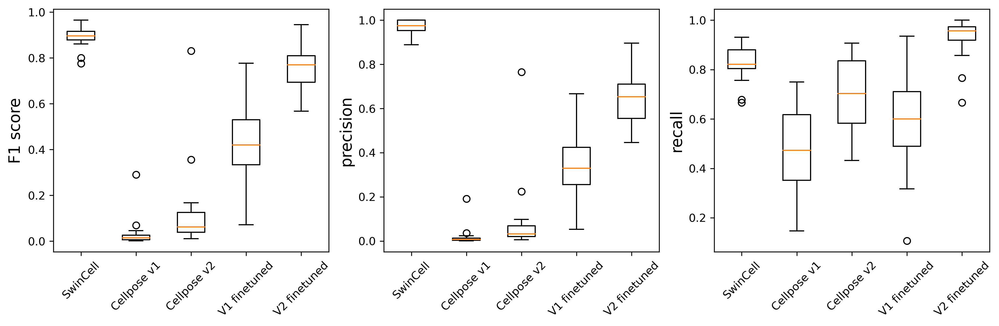

In [40]:
fig,ax = plt.subplots(1,3,figsize=(15,4), dpi=300)

columns_f1 = [f1_3d_list[:,0],f1_2d_algo1_list[:,0],f1_2d_algo1_after_training_list[:,0],f1_2d_algo2_list[:,0],f1_2d_algo2_after_training_list[:,0]]
columns_precision = [precision_3d_list[:,0],precision_2d_algo1_list[:,0],precision_2d_algo1_after_training_list[:,0],precision_2d_algo2_list[:,0],precision_2d_algo2_after_training_list[:,0]]
columns_recall = [recall_3d_list[:,0],recall_2d_algo1_list[:,0],recall_2d_algo1_after_training_list[:,0],recall_2d_algo2_list[:,0],recall_2d_algo2_after_training_list[:,0]]

ax[0].boxplot(columns_f1)
ax[0].set_ylabel('F1 score',fontsize =14)
ax[0].set_xticklabels(['SwinCell','Cellpose v1','Cellpose v2','V1 finetuned','V2 finetuned'],fontsize =10,rotation=45)

ax[1].boxplot(columns_precision)
ax[1].set_ylabel('precision',fontsize =14)
ax[1].set_xticklabels(['SwinCell','Cellpose v1','Cellpose v2','V1 finetuned','V2 finetuned'],fontsize =10,rotation=45)

ax[2].boxplot(columns_recall)
ax[2].set_ylabel('recall',fontsize =14)
ax[2].set_xticklabels(['SwinCell','Cellpose v1','Cellpose v2','V1 finetuned','V2 finetuned'],fontsize =10,rotation=45)

In [8]:
# from numba import jit

from stardist_matching import matching
from cv2_utils import get_random_cmap


In [12]:
# pip install -U numba

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
     |████████████████████████████████| 3.7 MB 7.9 MB/s eta 0:00:01
     |████████████████████████████████| 43.8 MB 116.8 MB/s eta 0:00:01
  Attempting uninstall: llvmlite
    Found existing installation: llvmlite 0.38.1
    Uninstalling llvmlite-0.38.1:
      Successfully uninstalled llvmlite-0.38.1
  Attempting uninstall: numba
    Found existing installation: numba 0.55.2
    Uninstalling numba-0.55.2:
      Successfully uninstalled numba-0.55.2
Note: you may need to restart the kernel to use updated packages.


(70, 624, 924) (70, 624, 924) (70, 624, 924) (70, 624, 924) (70, 624, 924) (70, 624, 924)


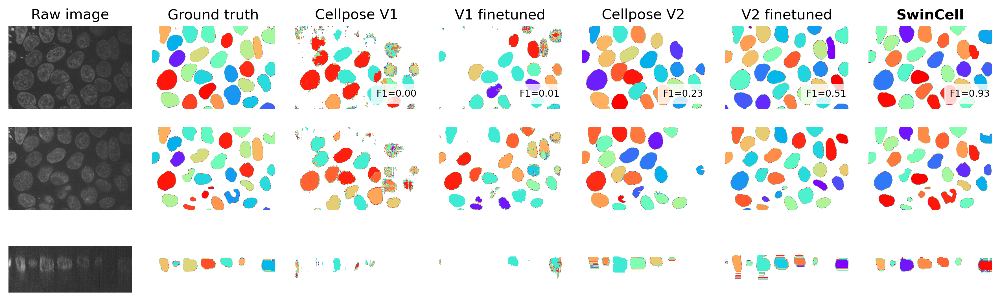

In [ ]:
import tifffile
from matplotlib import pyplot as plt
import scipy.ndimage as ndimage
file_idx = 19
slice1 = 29
slice2 = 21
side_slice1 = 70
thre_single_matching= 0.8
img_raw = tifffile.imread(raw_image_files[file_idx])
gt_img = tifffile.imread(gt_files[file_idx])
# print(img_raw.shape)
img_2d_algo1 = tifffile.imread(results_2d_files_algo1[file_idx])
img_2d_algo2 = tifffile.imread(results_2d_files_algo2[file_idx])  
img_2d_algo1_after_training = tifffile.imread(results_2d_files_algo1_after_training[file_idx])
img_2d_algo2_after_training = tifffile.imread(results_2d_files_algo2_after_training[file_idx]) 
img_3d = tifffile.imread(results_3d_files[file_idx]) 
print(img_raw.shape,img_3d.shape,img_2d_algo1.shape,img_2d_algo2.shape,img_2d_algo1_after_training.shape,img_2d_algo2_after_training.shape)

# fig,ax = plt.subplots(3,7,figsize=(12,4), dpi=300)

# cell_num =70
# textx = img_raw.shape[2]-315
# texty = img_raw.shape[1]-95

# ax[0,0].imshow(img_raw[slice1],cmap='gray')
# ax[0,0].set_title('Raw image')

# ax[0,1].imshow(gt_img[slice1],cmap= get_random_cmap(cell_num))
# ax[0,1].set_title('Ground truth')

# ax[0,2].imshow(img_2d_algo1[slice1],cmap= get_random_cmap(cell_num))
# ax[0,2].set_title('Cellpose V1')
# tempf1 =matching(gt_img,img_2d_algo1, thresh=thre_single_matching).f1
# ax[0,2].text(textx, texty, 'F1={:0.2f}'.format(tempf1), bbox=dict(facecolor='white', alpha=0.8,edgecolor='white'), fontsize=8,)


# ax[0,3].imshow(img_2d_algo1_after_training[slice1],cmap= get_random_cmap(cell_num))
# ax[0,3].set_title('V1 finetuned')
# tempf1 =matching(gt_img,img_2d_algo1_after_training, thresh=thre_single_matching).f1
# ax[0,3].text(textx, texty, 'F1={:0.2f}'.format(tempf1), bbox=dict(facecolor='white', alpha=0.8,edgecolor='white'), fontsize=8,)

# ax[0,4].imshow(img_2d_algo2[slice1],cmap= get_random_cmap(cell_num))
# ax[0,4].set_title('Cellpose V2')
# tempf1 =matching(gt_img,img_2d_algo2, thresh=thre_single_matching).f1
# ax[0,4].text(textx, texty, 'F1={:0.2f}'.format(tempf1), bbox=dict(facecolor='white', alpha=0.8,edgecolor='white'), fontsize=8,)

# ax[0,5].imshow(img_2d_algo2_after_training[slice1],cmap= get_random_cmap(cell_num))
# ax[0,5].set_title('V2 finetuned')
# tempf1 =matching(gt_img,img_2d_algo2_after_training, thresh=thre_single_matching).f1
# # tempf1 =matching(gt_img[slice1],img_2d_algo2_after_training[slice1], thresh=thre_single_matching).f1
# ax[0,5].text(textx, texty, 'F1={:0.2f}'.format(tempf1), bbox=dict(facecolor='white', alpha=0.8,edgecolor='white'), fontsize=8,)

# ax[0,6].imshow(img_3d[slice1],cmap= get_random_cmap(cell_num))
# ax[0,6].set_title('SwinCell',fontweight='bold')
# tempf1 =matching(gt_img,img_3d, thresh=thre_single_matching).f1
# # tempf1 =matching(gt_img[slice1],img_3d[slice1], thresh=thre_single_matching).f1
# ax[0,6].text(textx, texty, 'F1={:0.2f}'.format(tempf1), bbox=dict(facecolor='white', alpha=0.8,edgecolor='white'), fontsize=8,)
# #-------------------------------------------------------------------------------------


# ax[1,0].imshow(img_raw[slice2],cmap='gray')
# ax[1,1].imshow(gt_img[slice2],cmap= get_random_cmap(cell_num))
# ax[1,2].imshow(img_2d_algo1[slice2],cmap= get_random_cmap(cell_num))
# ax[1,3].imshow(img_2d_algo1_after_training[slice2],cmap= get_random_cmap(cell_num))

# ax[1,4].imshow(img_2d_algo2[slice2],cmap= get_random_cmap(cell_num))
# ax[1,5].imshow(img_2d_algo2_after_training[slice2],cmap= get_random_cmap(cell_num))
# ax[1,6].imshow(img_3d[slice2],cmap= get_random_cmap(cell_num))

# # 

# ax[2,0].imshow(ndimage.zoom(img_raw[:,side_slice1],(5,1)),cmap='gray')
# ax[2,1].imshow(ndimage.zoom(gt_img[:,side_slice1],(5,1)),cmap= get_random_cmap(cell_num))
# ax[2,2].imshow(ndimage.zoom(img_2d_algo1[:,side_slice1],(5,1)),cmap= get_random_cmap(cell_num))
# ax[2,3].imshow(ndimage.zoom(img_2d_algo1_after_training[:,side_slice1],(5,1)),cmap= get_random_cmap(cell_num))

# ax[2,4].imshow(ndimage.zoom(img_2d_algo2[:,side_slice1],(5,1)),cmap= get_random_cmap(cell_num))
# ax[2,5].imshow(ndimage.zoom(img_2d_algo2_after_training[:,side_slice1],(5,1)),cmap= get_random_cmap(cell_num))
# ax[2,6].imshow(ndimage.zoom(img_3d[:,side_slice1],(5,1)),cmap= get_random_cmap(cell_num))

# for i in range(7):
#   for j in range(3):
#     ax[j,i].axis('off')
# plt.tight_layout()


(70, 624, 924)
(70, 624, 924) (70, 624, 924) (70, 624, 924) (70, 624, 924) (70, 624, 924) (70, 624, 924)
22 4


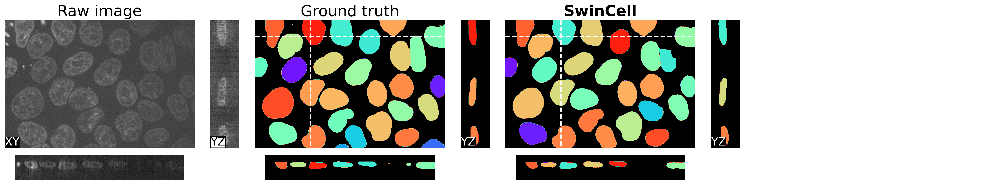

In [77]:
# testing show side views at the same time
import tifffile
from matplotlib import pyplot as plt
import scipy.ndimage as ndimage
from swincell.utils.plot_utils import get_random_cmap
from swincell.utils.utils import matching
file_idx = 19
slicez = 26
# slice2 = 21
# yz_slice = 100
# xz_slice = 150
xz_slice = 270
yz_slice = 80
thre_single_matching= 0.8
font_size = 16
title_size = 24
img_raw = tifffile.imread(raw_image_files[file_idx])
gt_img = tifffile.imread(gt_files[file_idx])
print(img_raw.shape)
img_2d_algo1 = tifffile.imread(results_2d_files_algo1[file_idx])
img_2d_algo2 = tifffile.imread(results_2d_files_algo2[file_idx])  
img_2d_algo1_after_training = tifffile.imread(results_2d_files_algo1_after_training[file_idx])
img_2d_algo2_after_training = tifffile.imread(results_2d_files_algo2_after_training[file_idx]) 
img_3d = tifffile.imread(results_3d_files[file_idx]) 
print(img_raw.shape,img_3d.shape,img_2d_algo1.shape,img_2d_algo2.shape,img_2d_algo1_after_training.shape,img_2d_algo2_after_training.shape)

row = 2
col = 8
width_ratio = 0.2
width = int(924*4*1.2/200)
height = int(624*1.3/200)
print(width,height)
fig,ax = plt.subplots(row,col,figsize=(width,height), dpi=300,gridspec_kw={'width_ratios': \
                                    [1, width_ratio,1, width_ratio,1, width_ratio,1, width_ratio],'height_ratios': [1, 0.2]})

cell_num =70
textx = img_raw.shape[2]-315
texty = img_raw.shape[1]-95
vmax =70
cmap1 = get_random_cmap(cell_num,background=0)

ax[0,0].imshow(img_raw[slicez],cmap='gray')
ax[0,0].set_title('Raw image',fontsize=title_size)
ax[0,0].text(0, img_raw.shape[1]-1, 'XY', fontsize=18,color='white',
         verticalalignment='bottom', bbox=dict(boxstyle='round,pad=0.0', facecolor='black', alpha=1, edgecolor='none'))

ax[0,2].imshow(gt_img[slicez],vmin=0,vmax=vmax,cmap= cmap1)
ax[0,2].set_title('Ground truth',fontsize=title_size)
ax[0,2].plot([0,img_raw.shape[2]-1],[yz_slice,yz_slice],linewidth=2,linestyle='--',color='white')
ax[0,2].plot([xz_slice,xz_slice],[0,img_raw.shape[1]-1],linewidth=2,linestyle='--',color='white')

ax[0,4].imshow(img_3d[slicez],vmin=0,vmax=vmax,cmap= cmap1)
ax[0,4].set_title('SwinCell',fontweight='bold',fontsize=title_size)
ax[0,4].plot([0,img_raw.shape[2]-1],[yz_slice,yz_slice],linewidth=2,linestyle='--',color='white')
ax[0,4].plot([xz_slice,xz_slice],[0,img_raw.shape[1]-1],linewidth=2,linestyle='--',color='white')
tempf1 =matching(gt_img,img_3d, thresh=thre_single_matching).f1
# tempf1 =matching(gt_img[slice1],img_3d[slice1], thresh=thre_single_matching).f1
# ax[0,4].text(textx, texty, 'F1={:0.2f}'.format(tempf1), bbox=dict(facecolor='white', alpha=0.8,edgecolor='white'), fontsize=font_size)
#-------------------------------------------------------------------------------------

if 1:   #zoom in to better visualize
    repeats = 2
    ax[0,1].imshow(np.repeat(img_raw[:,:,xz_slice].T,repeats,axis=-1),cmap='gray')
    ax[0,1].text(0, img_raw.shape[1]-1, 'YZ', fontsize=18,color='white',
         verticalalignment='bottom', bbox=dict(boxstyle='round,pad=0.0', facecolor='black', alpha=1, edgecolor='none'))

    ax[0,3].imshow(np.repeat(gt_img[:,:,xz_slice].T,repeats,axis=-1),vmin=0,vmax=vmax,cmap= cmap1)
    ax[0,3].text(0, img_raw.shape[1]-1, 'YZ', fontsize=18,color='white',
         verticalalignment='bottom', bbox=dict(boxstyle='round,pad=0.0', facecolor='black', alpha=1, edgecolor='none'))
    ax[0,5].imshow(np.repeat(img_3d[:,:,xz_slice].T,repeats,axis=-1),vmin=0,vmax=vmax,cmap= cmap1)
    ax[0,5].text(0, img_raw.shape[1]-1, 'YZ', fontsize=18,color='white',
         verticalalignment='bottom', bbox=dict(boxstyle='round,pad=0.0', facecolor='black', alpha=1, edgecolor='none'))

    ax[1,0].imshow(np.repeat(img_raw[:,yz_slice],repeats,axis=0),cmap='gray')
    ax[1,2].imshow(np.repeat(gt_img[:,yz_slice],repeats,axis=0),vmin=0,vmax=vmax,cmap= cmap1)
    ax[1,4].imshow(np.repeat(img_3d[:,yz_slice],repeats,axis=0),vmin=0,vmax=vmax,cmap= cmap1)

else: # no zoom in
    ax[0,1].imshow(img_raw[:,:,xz_slice].T,cmap='gray')
    ax[0,3].imshow(gt_img[:,:,xz_slice].T,vmin=0,vmax=vmax,cmap= cmap1)
    ax[0,5].imshow(img_3d[:,:,xz_slice].T,vmin=0,vmax=vmax,cmap= cmap1)


    ax[1,0].imshow(img_raw[:,yz_slice],cmap='gray')
    ax[1,2].imshow(gt_img[:,yz_slice],vmin=0,vmax=vmax,cmap= cmap1)
    ax[1,4].imshow(img_3d[:,yz_slice],vmin=0,vmax=vmax,cmap= cmap1)

for i in range(col):
  for j in range(row):
    ax[j,i].axis('off')
plt.tight_layout()


(70, 624, 924) (70, 624, 924) (70, 624, 924) (70, 624, 924) (70, 624, 924) (70, 624, 924)
(70, 624, 924) (70, 624, 924) (70, 624, 924) (70, 624, 924) (70, 624, 924) (70, 624, 924)
25 6


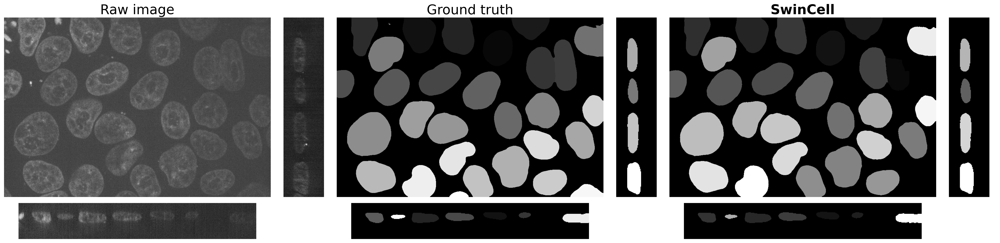

In [31]:
# testing show side views at the same time
import tifffile
from matplotlib import pyplot as plt
import scipy.ndimage as ndimage
from skimage.segmentation import relabel_sequential
file_idx = 19
slice1 = 26
slice2 = 21
side_slice1 = 70
xz_slice = 150
thre_single_matching= 0.8
font_size = 16
title_size = 24
img_raw = tifffile.imread(raw_image_files[file_idx])
gt_img = tifffile.imread(gt_files[file_idx])
# print(img_raw.shape)
img_2d_algo1 = tifffile.imread(results_2d_files_algo1[file_idx])
img_2d_algo2 = tifffile.imread(results_2d_files_algo2[file_idx])  
img_2d_algo1_after_training = tifffile.imread(results_2d_files_algo1_after_training[file_idx])
img_2d_algo2_after_training = tifffile.imread(results_2d_files_algo2_after_training[file_idx]) 
img_3d = tifffile.imread(results_3d_files[file_idx]) 
print(img_raw.shape,img_3d.shape,img_2d_algo1.shape,img_2d_algo2.shape,img_2d_algo1_after_training.shape,img_2d_algo2_after_training.shape)
# relabel:
img_2d_algo1 = relabel_sequential(img_2d_algo1)[0]
img_2d_algo2 = relabel_sequential(img_2d_algo2)[0]
img_2d_algo1_after_training = relabel_sequential(img_2d_algo1_after_training)[0]
img_2d_algo2_after_training = relabel_sequential(img_2d_algo2_after_training)[0]
img_3d = relabel_sequential(img_3d)[0]
print(img_raw.shape,img_3d.shape,img_2d_algo1.shape,img_2d_algo2.shape,img_2d_algo1_after_training.shape,img_2d_algo2_after_training.shape)
row = 2
col = 6
width_ratio = 0.2
width = int(924*2.8/100)
height = int(624/100)
print(width,height)
# fig,ax = plt.subplots(row,col,figsize=(width,height), dpi=300,gridspec_kw={'width_ratios': \
#                                     [1, width_ratio,1, width_ratio,1, width_ratio,1, width_ratio],'height_ratios': [1, 0.2]})
fig,ax = plt.subplots(row,col,figsize=(width,height), dpi=300,gridspec_kw={'width_ratios': \
                                    [1, width_ratio,1, width_ratio,1, width_ratio],'height_ratios': [1, 0.2]})
cell_num =70
textx = img_raw.shape[2]-315
texty = img_raw.shape[1]-95

# cmap1 = get_random_cmap(cell_num,background=0)
cmap1 = 'gray'

ax[0,0].imshow(img_raw[slice1],cmap='gray')
ax[0,0].set_title('Raw image',fontsize=title_size)

ax[0,2].imshow(gt_img[slice1],cmap= cmap1)
ax[0,2].set_title('Ground truth',fontsize=title_size)

ax[0,4].imshow(img_3d[slice1],cmap= cmap1)
ax[0,4].set_title('SwinCell',fontweight='bold',fontsize=title_size)
tempf1 =matching(gt_img,img_3d, thresh=thre_single_matching).f1
# tempf1 =matching(gt_img[slice1],img_3d[slice1], thresh=thre_single_matching).f1
# ax[0,4].text(textx, texty, 'F1={:0.2f}'.format(tempf1), bbox=dict(facecolor='white', alpha=0.8,edgecolor='white'), fontsize=font_size)
#-------------------------------------------------------------------------------------
if 1:   #zoom in to better visualize
    repeats = 2
    ax[0,1].imshow(np.repeat(img_raw[:,:,xz_slice].T,repeats,axis=-1),cmap='gray')
    ax[0,3].imshow(np.repeat(gt_img[:,:,xz_slice].T,repeats,axis=-1),cmap= cmap1)
    ax[0,5].imshow(np.repeat(img_3d[:,:,xz_slice].T,repeats,axis=-1),cmap= cmap1)

    ax[1,0].imshow(np.repeat(img_raw[:,side_slice1],repeats,axis=0),cmap='gray')
    ax[1,2].imshow(np.repeat(gt_img[:,side_slice1],repeats,axis=0),cmap= cmap1)
    ax[1,4].imshow(np.repeat(img_3d[:,side_slice1],repeats,axis=0),cmap= cmap1)

else: # no zoom in
    ax[0,1].imshow(img_raw[:,:,xz_slice].T,cmap='gray')
    ax[0,3].imshow(gt_img[:,:,xz_slice].T,cmap= cmap1)
    ax[0,5].imshow(img_3d[:,:,xz_slice].T,cmap= cmap1)
# ax[0,5].set_title('SwinPose',fontweight='bold')

    ax[1,0].imshow(img_raw[:,side_slice1],cmap='gray')
    ax[1,2].imshow(gt_img[:,side_slice1],cmap= cmap1)
    ax[1,4].imshow(img_3d[:,side_slice1],cmap= cmap1)

for i in range(col):
  for j in range(row):
    ax[j,i].axis('off')
plt.tight_layout()

(70, 624, 924) (70, 624, 924) (70, 624, 924) (70, 624, 924) (70, 624, 924) (70, 624, 924)
25 6


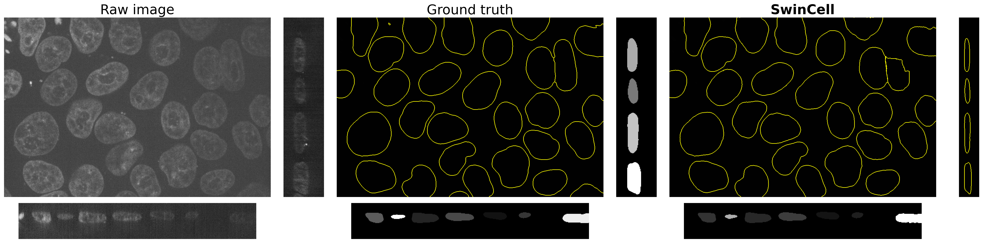

In [41]:
# testing show boundary
import tifffile
from matplotlib import pyplot as plt
import scipy.ndimage as ndimage
from skimage.segmentation import relabel_sequential,mark_boundaries
file_idx = 19
slice1 = 26
slice2 = 21
side_slice1 = 70
xz_slice = 150
thre_single_matching= 0.8
font_size = 16
title_size = 24
img_raw = tifffile.imread(raw_image_files[file_idx])
gt_img = tifffile.imread(gt_files[file_idx])
# print(img_raw.shape)
img_2d_algo1 = tifffile.imread(results_2d_files_algo1[file_idx])
img_2d_algo2 = tifffile.imread(results_2d_files_algo2[file_idx])  
img_2d_algo1_after_training = tifffile.imread(results_2d_files_algo1_after_training[file_idx])
img_2d_algo2_after_training = tifffile.imread(results_2d_files_algo2_after_training[file_idx]) 
img_3d = tifffile.imread(results_3d_files[file_idx]) 
print(img_raw.shape,img_3d.shape,img_2d_algo1.shape,img_2d_algo2.shape,img_2d_algo1_after_training.shape,img_2d_algo2_after_training.shape)
# relabel:
# img_2d_algo1 = relabel_sequential(img_2d_algo1)[0]
# img_2d_algo2 = relabel_sequential(img_2d_algo2)[0]
# img_2d_algo1_after_training = relabel_sequential(img_2d_algo1_after_training)[0]
# img_2d_algo2_after_training = relabel_sequential(img_2d_algo2_after_training)[0]
# img_3d = relabel_sequential(img_3d)[0]
# print(img_raw.shape,img_3d.shape,img_2d_algo1.shape,img_2d_algo2.shape,img_2d_algo1_after_training.shape,img_2d_algo2_after_training.shape)
#--------------------------------------------
row = 2
col = 6
width_ratio = 0.2
width = int(924*2.8/100)
height = int(624/100)
print(width,height)
# fig,ax = plt.subplots(row,col,figsize=(width,height), dpi=300,gridspec_kw={'width_ratios': \
#                                     [1, width_ratio,1, width_ratio,1, width_ratio,1, width_ratio],'height_ratios': [1, 0.2]})
fig,ax = plt.subplots(row,col,figsize=(width,height), dpi=300,gridspec_kw={'width_ratios': \
                                    [1, width_ratio,1, width_ratio,1, width_ratio],'height_ratios': [1, 0.2]})
cell_num =70
textx = img_raw.shape[2]-315
texty = img_raw.shape[1]-95

# cmap1 = get_random_cmap(cell_num,background=0)
cmap1 = 'gray'

ax[0,0].imshow(img_raw[slice1],cmap='gray')
ax[0,0].set_title('Raw image',fontsize=title_size)

gt_img_bound_xy = mark_boundaries(img_raw[slice1], gt_img[slice1], color=(1, 1, 0), outline_color=None, mode='thick', background_label=0)
ax[0,2].imshow(gt_img_bound_xy)
ax[0,2].set_title('Ground truth',fontsize=title_size)

img_3d_bound_xy = mark_boundaries(img_raw[slice1], img_3d[slice1], color=(1, 1, 0), outline_color=None, mode='thick', background_label=0)
ax[0,4].imshow(img_3d_bound_xy)
ax[0,4].set_title('SwinCell',fontweight='bold',fontsize=title_size)
tempf1 =matching(gt_img,img_3d, thresh=thre_single_matching).f1
# tempf1 =matching(gt_img[slice1],img_3d[slice1], thresh=thre_single_matching).f1
# ax[0,4].text(textx, texty, 'F1={:0.2f}'.format(tempf1), bbox=dict(facecolor='white', alpha=0.8,edgecolor='white'), fontsize=font_size)
#-------------------------------------------------------------------------------------
if 1:   #zoom in to better visualize
    repeats = 2
    ax[0,1].imshow(np.repeat(img_raw[:,:,xz_slice].T,repeats,axis=-1),cmap='gray')
    ax[0,3].imshow(np.repeat(gt_img[:,:,xz_slice].T,repeats,axis=-1),cmap= cmap1)
    # ax[0,5].imshow(np.repeat(img_3d[:,:,xz_slice].T,repeats,axis=-1),cmap= cmap1)
    import skimage
    # bound_3d = skimage.segmentation.mark_boundaries(img_raw[:,:,xz_slice].T, img_3d[:,:,xz_slice].T, color=(1, 1, 0), outline_color=None, mode='thick', background_label=0)
    bound_gt_xy = skimage.segmentation.mark_boundaries(img_raw[:,:,xz_slice].T, gt_img[:,:,xz_slice].T, color=(1, 1, 0), outline_color=None, mode='thick', background_label=0)
    bound_3d = skimage.segmentation.mark_boundaries(img_raw[:,:,xz_slice].T, img_3d[:,:,xz_slice].T, color=(1, 1, 0), outline_color=None, mode='thick', background_label=0)
    
    ax[0,5].imshow(bound_3d,cmap= cmap1)
    
    ax[1,0].imshow(np.repeat(img_raw[:,side_slice1],repeats,axis=0),cmap='gray')
    ax[1,2].imshow(np.repeat(gt_img[:,side_slice1],repeats,axis=0),cmap= cmap1)
    ax[1,4].imshow(np.repeat(img_3d[:,side_slice1],repeats,axis=0),cmap= cmap1)

else: # no zoom in
    ax[0,1].imshow(img_raw[:,:,xz_slice].T,cmap='gray')
    ax[0,3].imshow(gt_img[:,:,xz_slice].T,cmap= cmap1)
    ax[0,5].imshow(img_3d[:,:,xz_slice].T,cmap= cmap1)
# ax[0,5].set_title('SwinPose',fontweight='bold')

    ax[1,0].imshow(img_raw[:,side_slice1],cmap='gray')
    ax[1,2].imshow(gt_img[:,side_slice1],cmap= cmap1)
    ax[1,4].imshow(img_3d[:,side_slice1],cmap= cmap1)

for i in range(col):
  for j in range(row):
    ax[j,i].axis('off')
plt.tight_layout()

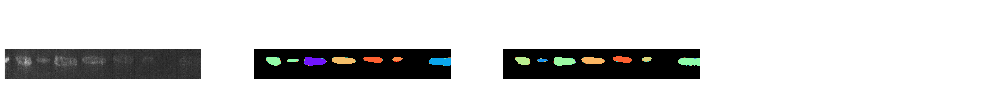

In [137]:
width = int(924*4*1.2/200)
height = int(624*1.3/200)
fig,ax = plt.subplots(row,col,figsize=(width,height), dpi=300,gridspec_kw={'width_ratios': \
                                    [1, width_ratio,1, width_ratio,1, width_ratio,1, width_ratio]})

if 1:   #zoom in to better visualize
    repeats = 2
    # ax[0,1].imshow(np.repeat(img_raw[:,:,xz_slice].T,repeats,axis=-1),cmap='gray')
    # ax[0,3].imshow(np.repeat(gt_img[:,:,xz_slice].T,repeats,axis=-1),cmap= get_random_cmap(cell_num))
    # ax[0,5].imshow(np.repeat(img_3d[:,:,xz_slice].T,repeats,axis=-1),cmap= get_random_cmap(cell_num))

    ax[1,0].imshow(np.repeat(img_raw[:,side_slice1],repeats,axis=0),cmap='gray')
    ax[1,2].imshow(np.repeat(gt_img[:,side_slice1],repeats,axis=0),cmap= get_random_cmap(cell_num))
    ax[1,4].imshow(np.repeat(img_3d[:,side_slice1],repeats,axis=0),cmap= get_random_cmap(cell_num))

else: # no zoom in
    # ax[0,1].imshow(img_raw[:,:,xz_slice].T,cmap='gray')
    # ax[0,3].imshow(gt_img[:,:,xz_slice].T,cmap= get_random_cmap(cell_num))
    # ax[0,5].imshow(img_3d[:,:,xz_slice].T,cmap= get_random_cmap(cell_num))
# ax[0,5].set_title('SwinPose',fontweight='bold')

    ax[1,0].imshow(img_raw[:,side_slice1],cmap='gray')
    ax[1,2].imshow(gt_img[:,side_slice1],cmap= get_random_cmap(cell_num))
    ax[1,4].imshow(img_3d[:,side_slice1],cmap= get_random_cmap(cell_num))


for i in range(col):
      for j in range(row):
            ax[j,i].axis('off')
plt.tight_layout()

(70, 624, 924) (70, 624, 924) (70, 624, 924) (70, 624, 924) (70, 624, 924) (70, 624, 924)
22 4


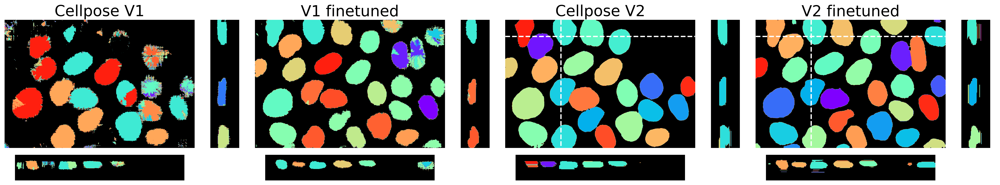

In [56]:
# testing show side views at the same time
import tifffile
from matplotlib import pyplot as plt
import scipy.ndimage as ndimage
file_idx = 19
# slice1 = 26
# slice2 = 21
# side_slice1 = 70
# xz_slice = 150
xz_slice = 270
yz_slice = 80
thre_single_matching= 0.8
font_size = 16
title_size = 24
img_raw = tifffile.imread(raw_image_files[file_idx])
gt_img = tifffile.imread(gt_files[file_idx])
# print(img_raw.shape)
img_2d_algo1 = tifffile.imread(results_2d_files_algo1[file_idx])
img_2d_algo2 = tifffile.imread(results_2d_files_algo2[file_idx])  
img_2d_algo1_after_training = tifffile.imread(results_2d_files_algo1_after_training[file_idx])
img_2d_algo2_after_training = tifffile.imread(results_2d_files_algo2_after_training[file_idx]) 
img_3d = tifffile.imread(results_3d_files[file_idx]) 
print(img_raw.shape,img_3d.shape,img_2d_algo1.shape,img_2d_algo2.shape,img_2d_algo1_after_training.shape,img_2d_algo2_after_training.shape)

row = 2
col = 8
width_ratio = 0.2
# width = int(924*3*1.2/200)
# height = int(624*1.2/200)
width = 22
height = 4

print(width,height)
fig,ax = plt.subplots(row,col,figsize=(width,height), dpi=300,gridspec_kw={'width_ratios': \
                                    [1, width_ratio,1, width_ratio,1, width_ratio,1, width_ratio],'height_ratios': [1, 0.2]})

cell_num =60
textx = img_raw.shape[2]-315
texty = img_raw.shape[1]-95

ax[0,0].imshow(img_2d_algo1[slicez],cmap= cmap1)
ax[0,0].set_title('Cellpose V1',fontsize=title_size)
tempf1 =matching(gt_img,img_2d_algo1, thresh=thre_single_matching).f1
# ax[0,0].text(textx, texty, 'F1={:0.2f}'.format(tempf1), bbox=dict(facecolor='white', alpha=0.8,edgecolor='white'), fontsize=font_size)

ax[0,2].imshow(img_2d_algo1_after_training[slicez],vmin=0,vmax=vmax,cmap= cmap1)
ax[0,2].set_title('V1 finetuned',fontsize=title_size)
tempf1 =matching(gt_img,img_2d_algo1_after_training, thresh=thre_single_matching).f1
# ax[0,2].text(textx, texty, 'F1={:0.2f}'.format(tempf1), bbox=dict(facecolor='white', alpha=0.8,edgecolor='white'), fontsize=font_size)
# Cellpose V2
ax[0,4].imshow(img_2d_algo2[slicez],vmin=0,vmax=vmax,cmap= cmap1)
ax[0,4].set_title('Cellpose V2',fontsize=title_size)
ax[0,4].plot([0,img_raw.shape[2]-1],[yz_slice,yz_slice],linewidth=2,linestyle='--',color='white')
ax[0,4].plot([xz_slice,xz_slice],[0,img_raw.shape[1]-1],linewidth=2,linestyle='--',color='white')

tempf1 =matching(gt_img,img_2d_algo2, thresh=thre_single_matching).f1
# ax[0,4].text(textx, texty, 'F1={:0.2f}'.format(tempf1), bbox=dict(facecolor='white', alpha=0.8,edgecolor='white'), fontsize=font_size)

ax[0,6].imshow(img_2d_algo2_after_training[slicez],vmin=0,vmax=vmax,cmap= cmap1)
ax[0,6].set_title('V2 finetuned',fontsize=title_size)
ax[0,6].plot([0,img_raw.shape[2]-1],[yz_slice,yz_slice],linewidth=2,linestyle='--',color='white')
ax[0,6].plot([xz_slice,xz_slice],[0,img_raw.shape[1]-1],linewidth=2,linestyle='--',color='white')
tempf1 =matching(gt_img,img_2d_algo2_after_training, thresh=thre_single_matching).f1
# ax[0,6].text(textx, texty, 'F1={:0.2f}'.format(tempf1), bbox=dict(facecolor='white', alpha=0.8,edgecolor='white'), fontsize=font_size)
#-------------------------------------------------------------------------------------
if 1:   #zoom in to better visualize
    repeats = 2
    ax[0,1].imshow(np.repeat(img_2d_algo1[:,:,xz_slice].T,repeats,axis=-1),vmin=0,vmax=vmax,cmap= cmap1)
    ax[0,3].imshow(np.repeat(img_2d_algo1_after_training[:,:,xz_slice].T,repeats,axis=-1),vmin=0,vmax=vmax,cmap= cmap1)
    ax[0,5].imshow(np.repeat(img_2d_algo2[:,:,xz_slice].T,repeats,axis=-1),vmin=0,vmax=vmax,cmap= cmap1)
    ax[0,7].imshow(np.repeat(img_2d_algo2_after_training[:,:,xz_slice].T,repeats,axis=-1),vmin=0,vmax=vmax,cmap= cmap1)

    ax[1,0].imshow(np.repeat(img_2d_algo1[:,yz_slice],repeats,axis=0),vmin=0,vmax=vmax,cmap= cmap1)
    ax[1,2].imshow(np.repeat(img_2d_algo1_after_training[:,yz_slice],repeats,axis=0),vmin=0,vmax=vmax,cmap= cmap1)
    ax[1,4].imshow(np.repeat(img_2d_algo2[:,yz_slice],repeats,axis=0),vmin=0,vmax=vmax,cmap= cmap1)
    ax[1,6].imshow(np.repeat(img_2d_algo2_after_training[:,yz_slice],repeats,axis=0),vmin=0,vmax=vmax,cmap= cmap1)

else: # no zoom in
    ax[0,1].imshow(img_raw[:,:,xz_slice].T,cmap='gray')
    ax[0,3].imshow(gt_img[:,:,xz_slice].T,vmin=0,vmax=vmax,cmap= cmap1)
    ax[0,5].imshow(img_3d[:,:,xz_slice].T,vmin=0,vmax=vmax,cmap= cmap1)
# ax[0,5].set_title('Swin',fontweight='bold')

    ax[1,0].imshow(img_raw[:,yz_slice],cmap='gray')
    ax[1,2].imshow(gt_img[:,yz_slice],vmin=0,vmax=vmax,cmap= cmap1)
    ax[1,4].imshow(img_3d[:,yz_slice],vmin=0,vmax=vmax,cmap= cmap1)

for i in range(col):
  for j in range(row):
    ax[j,i].axis('off')
plt.tight_layout()


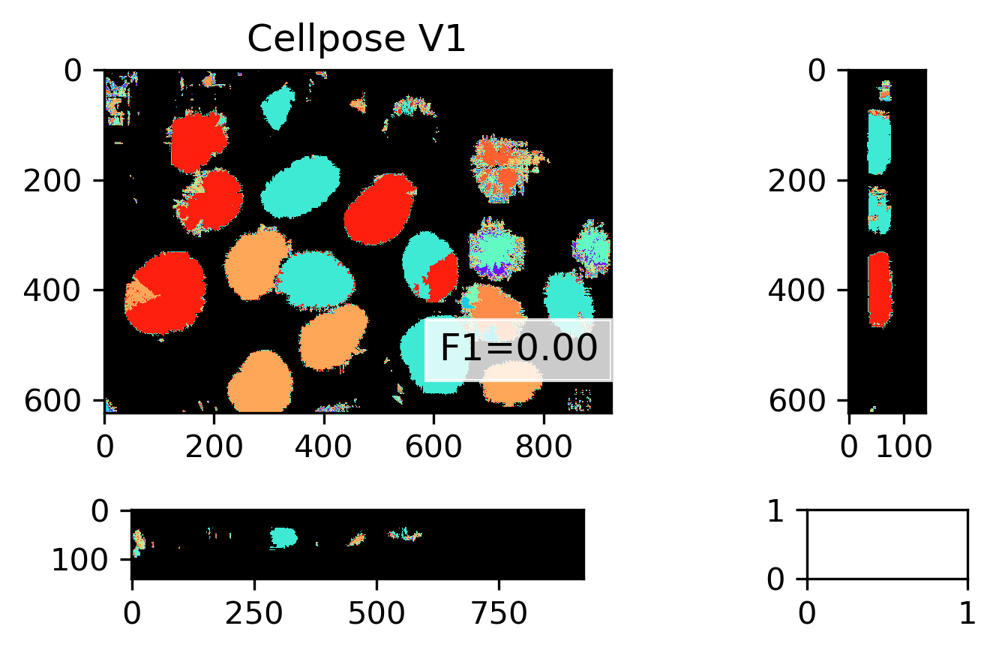

In [152]:
row = 2
col = 2
width = int(924*1*1.2/200)
height = int(624*1.2/200)
fig,ax = plt.subplots(row,col,figsize=(width,height), dpi=300,gridspec_kw={'width_ratios': \
                                    [1, 0.2],'height_ratios': [1, 0.2]})
font_size = 12
title_size = 12

cell_num =70
textx = img_raw.shape[2]-315
texty = img_raw.shape[1]-95

ax[0,0].imshow(img_2d_algo1[slice1],cmap= get_random_cmap(cell_num))
ax[0,0].set_title('Cellpose V1',fontsize=title_size)
tempf1 =matching(gt_img,img_2d_algo1, thresh=thre_single_matching).f1
ax[0,0].text(textx, texty, 'F1={:0.2f}'.format(tempf1), bbox=dict(facecolor='white', alpha=0.8,edgecolor='white'), fontsize=font_size)

ax[0,1].imshow(np.repeat(img_2d_algo1[:,:,xz_slice].T,repeats,axis=-1),cmap= get_random_cmap(cell_num))
ax[1,0].imshow(np.repeat(img_2d_algo1[:,side_slice1],repeats,axis=0),cmap= get_random_cmap(cell_num))

# for i in range(col):
#       for j in range(row):
#             ax[j,i].axis('off')
plt.tight_layout()

## test two categories only

20 20 20 20 20 20


Text(0.5, 0, 'IoU threshold')

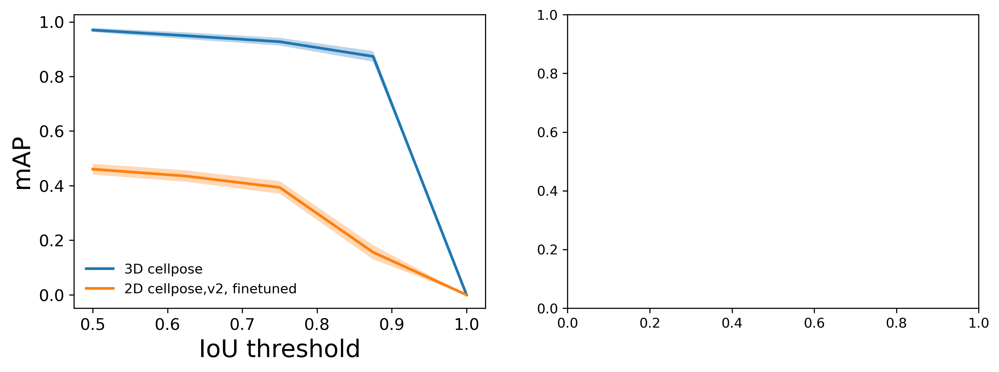

In [171]:
from stardist_matching import matching
import pandas as pd
N_thresholds =5


# show results
from natsort import natsorted
import tifffile 
import glob
import numpy as np
root_folder = '/data/download_data/quilt-data-access-tutorials-main/all_fov/allen100'
image_files = natsorted(glob.glob(root_folder + '/images/*.tiff'))
seg_files = natsorted(glob.glob(root_folder + '/masks/*.tiff'))
# print(seg_files)
valid_img_files = image_files[::5]
valid_seg_files = seg_files[::5]
# train_img_files = [f for i,f in enumerate(image_files) if i%5 != 0]
# train_seg_files = [f for i,f in enumerate(seg_files) if i%5 != 0]


# raw_img_folder = root_folder + '/images/[1,6].tiff'
#  before training 2d
# after training 2d
results_2d_folder_algo1_after_training = root_folder + '/results_2d_cellpose_algo1_after_training/*pred.tiff'
# results_2d_folder_algo2_after_training = root_folder + '/results_2d_cellpose_algo2_after_training/*pred.tiff'
results_2d_folder_algo2_after_training = root_folder + '/results_2d_cellpose_algo2_after_training/*dia_50.tiff'
# after training 3d
results_3d_folder = root_folder + '/results_3d_monai_minsize50000/*.tiff'
# results_3d_folder = root_folder + '/results_3d_monai_minsize2500/*.tiff'

# Ground truth
# gt_folder = root_folder + '/masks/*.tiff'
gt_files = valid_seg_files


# results_2d_files_algo1 = natsorted(glob.glob(results_2d_folder_algo1))
# results_2d_files_algo2 = natsorted(glob.glob(results_2d_folder_algo2))

# results_2d_files_algo1_after_training = natsorted(glob.glob(results_2d_folder_algo1_after_training))
results_2d_files_algo2_after_training = natsorted(glob.glob(results_2d_folder_algo2_after_training))


# results_3d_files = natsorted(glob.glob(results_3d_folder))[::5]
results_3d_files = natsorted(glob.glob(results_3d_folder))

raw_image_files = valid_img_files
# print(results_2d_files_algo1,results_2d_files_algo2,results_3d_files,gt_files)
print(len(raw_image_files),len(results_2d_files_algo1),len(results_3d_files),len(gt_files),len(results_2d_files_algo1_after_training),len(results_2d_files_algo2_after_training))

output = pd.DataFrame()
for i in range(len(results_2d_files_algo1)):
    for idxt,threshold in enumerate(np.linspace(0.5,1,N_thresholds)):
    # threshold = 0.5
        gt_img = tifffile.imread(gt_files[i])
        # results 3d
        img_3d = tifffile.imread(results_3d_files[i])
        # results 2d
        # img_2d_algo1 = tifffile.imread(results_2d_files_algo1[i])
        # img_2d_algo2 = tifffile.imread(results_2d_files_algo2[i])  
        # img_2d_algo1_after_training = tifffile.imread(results_2d_files_algo1_after_training[i])
        img_2d_algo2_after_training = tifffile.imread(results_2d_files_algo2_after_training[i])  

        # mAP_3d = matching(img_3d, gt_img, thresh=threshold).precision
        # mAP_2d_algo1 = matching(img_2d_algo1, gt_img, thresh=threshold).precision
        # mAP_2d_algo2 = matching(img_2d_algo2, gt_img, thresh=threshold).precision
        # mAP_2d_algo1_after_training = matching(img_2d_algo1_after_training, gt_img, thresh=threshold).precision
        # mAP_2d_algo2_after_training = matching(img_2d_algo2_after_training, gt_img, thresh=threshold).precision
        mAP_3d = matching(gt_img,img_3d,  thresh=threshold)
        mAP_2d_algo2_after_training = matching(gt_img,img_2d_algo2_after_training, thresh=threshold)

        df_temp = pd.DataFrame([mAP_3d])
        df_temp['img_id'] = str(gt_files[i].split('/')[-1])
        df_temp['method'] = '3d cellpose'
        output = pd.concat([output,df_temp])


        df_temp = pd.DataFrame([mAP_2d_algo2_after_training])
        df_temp['img_id'] = str(gt_files[i].split('/')[-1])
        df_temp['method'] = '2d cellpose algo2 after training'
        output = pd.concat([output,df_temp])

        # mAP_2d_algo1_list[i,idxt] = mAP_2d_algo1.precision
        # mAP_2d_algo2_list[i,idxt] = mAP_2d_algo2.precision
        # mAP_2d_algo1_after_training_list[i,idxt] = mAP_2d_algo1_after_training.precision
        # mAP_2d_algo2_after_training_list[i,idxt] = mAP_2d_algo2_after_training.precision
        # mAP_3d_list[i,idxt] = mAP_3d.precision

output_3d= output[output['method']=='3d cellpose']
output_2d_algo2_after_training= output[output['method']=='2d cellpose algo2 after training']

mAP_3d_list =output_3d['precision'].values.reshape(20,N_thresholds)
mAP_2d_algo2_after_training_list =output_2d_algo2_after_training['precision'].values.reshape(20,N_thresholds)

    
        # print(mAP_3d,mAP_2d_algo1,mAP_2d_algo2,mAP_2d_algo1_after_training,mAP_2d_algo2_after_training,'\n')
f1_3d_list =output_3d['f1'].values.reshape(20,N_thresholds)
f1_2d_algo2_after_training_list =output_2d_algo2_after_training['f1'].values.reshape(20,N_thresholds)


iou_thresholds = np.linspace(0.5,1,N_thresholds)
# fig,ax = plt.subplots(1,2,figsize=(12,4), dpi=300)
fig,ax = plt.subplots(1,2,figsize=(12,4), dpi=300)
# ax[0].plot(iou_thresholds,map_3d_mean,linewidth=2,label='3D cellpose')
# ax.fill_between(iou_thresholds,map_3d_mean-map_3d_se,map_3d_mean+map_3d_se,alpha=0.3,label='3D cellpose')
def plot_with_se(ax,matrix,label):
    mean = np.mean(matrix, axis=0)
    std = np.std(matrix, axis=0)
    se = std / np.sqrt(matrix.shape[0])
    ax.plot(iou_thresholds,mean,linewidth=2,label=label)
    ax.fill_between(iou_thresholds,mean-se,mean+se,alpha=0.3)
    return ax

plot_with_se(ax[0],mAP_3d_list,label='3D cellpose')
# plot_with_se(ax[0],mAP_2d_algo1_list,label='2D cellpose,v1')
# plot_with_se(ax[0],mAP_2d_algo1_after_training_list,label='2D cellpose,v1, finetuned')
# plot_with_se(ax[0],mAP_2d_algo2_list,label='2D cellpose,v2')
plot_with_se(ax[0],mAP_2d_algo2_after_training_list,label='2D cellpose,v2, finetuned')
ax[0].legend(loc='lower left',frameon=False,fontsize=10)
ax[0].tick_params(labelsize=12)
ax[0].set_ylabel('mAP',fontsize =18)
ax[0].set_xlabel('IoU threshold',fontsize =18)


In [226]:
# compare 2d results
output_2d = pd.DataFrame()


N_thresholds=2

# thre_list = [0.5, 0.25,0.375,0.625,0.75]
thre_list = [ 0.075,0.125, 0.25,0.375,0.5,0.625,0.75]
dia_list = [25,50,75,100,125]
# iou_thresholds = np.linspace(0.5,1,N_thresholds)
iou_thresholds = 0.5
for dia in dia_list:
    for thre in thre_list:
        results_2d =  root_folder + '/results_2d_cellpose_algo2_after_training/*_thre_' +str(thre) + '*dia_'+str(dia) +'.tiff'
        files = natsorted(glob.glob(results_2d))
        for file_idx in range(len(files)):
            img_2d  = tifffile.imread(files[file_idx])
            gt_img = tifffile.imread(gt_files[file_idx])

            res_match = matching(gt_img,img_2d,  thresh=0.5)


            df_temp = pd.DataFrame([res_match])
            df_temp['img_id'] = str(gt_files[i].split('/')[-1])
            df_temp['thre'] = thre
            df_temp['dia'] =dia

            output_2d = pd.concat([output_2d,df_temp])

        print(len(files))



20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20


In [196]:
# model performance in descending order:
# stitching threshold: 0.25, 0.375,0.5, 0.625 ,0.75
# 50>100>>>25


In [190]:
# output_2d.head(20)
stat =output_2d.groupby(['thre']).mean()
stat.head(20)

,thresh,fp,tp,fn,precision,recall,accuracy,f1,n_true,n_pred,mean_true_score,mean_matched_score,panoptic_quality
thre,,,,,,,,,,,,,
0.25,0.5,45.800000,22.733333,13.166667,0.401470,0.625065,0.376392,0.485112,35.9,68.533333,0.508897,0.737199,0.396716
0.375,0.5,48.083333,22.700000,13.200000,0.383482,0.624164,0.359700,0.471553,35.9,70.783333,0.508033,0.736952,0.385473
0.5,0.5,57.133333,22.616667,13.283333,0.326820,0.621993,0.308531,0.425672,35.9,79.750000,0.505381,0.735205,0.347099
0.625,0.5,82.066667,22.250000,13.650000,0.232579,0.611810,0.221992,0.335294,35.9,104.316667,0.495408,0.730914,0.271994
0.75,0.5,136.933333,21.183333,14.716667,0.137840,0.583070,0.132776,0.222122,35.9,158.116667,0.463625,0.701931,0.176597


In [231]:
stat_mean =output_2d.groupby(['dia','thre']).mean().reset_index()
stat_mean.head(50)

stat_se =output_2d.groupby(['dia','thre']).sem().reset_index()
stat_se.head(50)

,dia,thre,thresh,fp,tp,fn,precision,recall,accuracy,f1,n_true,n_pred,mean_true_score,mean_matched_score,panoptic_quality
0,25,0.075,0.0,10.616391,0.617614,1.928014,0.006555,0.015181,0.004547,0.008546,2.193171,10.906637,0.011238,0.057197,0.006231
1,25,0.125,0.0,10.683509,0.617614,1.928014,0.006560,0.015181,0.004551,0.008552,2.193171,10.971080,0.011238,0.057197,0.006235
2,25,0.250,0.0,10.743395,0.617614,1.928014,0.006499,0.015181,0.004510,0.008478,2.193171,11.033985,0.011238,0.057199,0.006190
3,25,0.375,0.0,10.969719,0.617614,1.928014,0.006414,0.015181,0.004452,0.008375,2.193171,11.262484,0.011191,0.057149,0.006099
4,25,0.500,0.0,11.936515,0.609033,1.950000,0.005641,0.015030,0.004060,0.007676,2.193171,12.224135,0.010984,0.057032,0.005553
5,25,0.625,0.0,14.987692,0.591497,1.951079,0.004865,0.014404,0.003530,0.006727,2.193171,15.260734,0.010417,0.056650,0.004835
6,25,0.750,0.0,20.758546,0.467918,2.000132,0.003298,0.011286,0.002362,0.004578,2.193171,20.922825,0.008249,0.060562,0.003185
7,50,0.075,0.0,2.985469,2.289880,0.753501,0.026555,0.026293,0.029156,0.026687,2.193171,4.078570,0.024806,0.008205,0.025528
8,50,0.125,0.0,2.977459,2.289880,0.753501,0.026445,0.026293,0.029065,0.026617,2.193171,4.070352,0.024806,0.008205,0.025484
9,50,0.250,0.0,2.963706,2.289880,0.753501,0.026215,0.026293,0.028945,0.026530,2.193171,4.055795,0.024809,0.008214,0.025452


Text(0.5, 0, 'Diameter (pixels)')

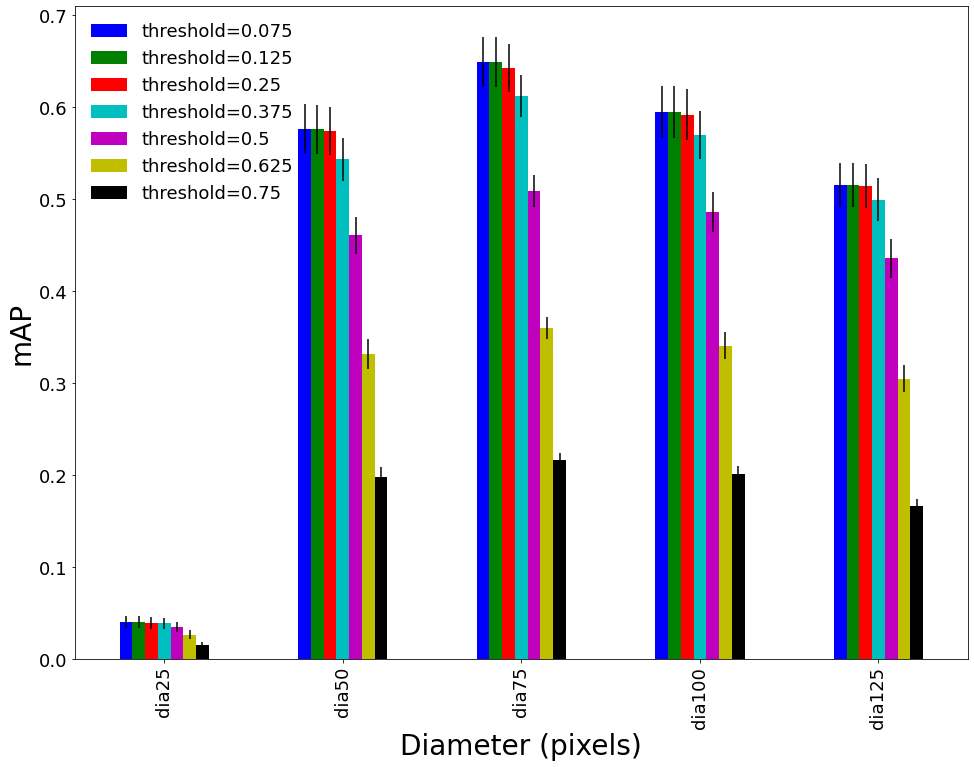

In [246]:
# res = stat1[stat1['dia']=='100']
# res.head()
thre_list = [ 0.075,0.125, 0.25,0.375,0.5,0.625,0.75]
#dia_list = [25,50,75,100,125]

df = pd.DataFrame()

#the groups can vary 
grp1 = 'thre=0.075'
grp2 = 'thre=0.125'
grp3 = 'thre=0.250'
grp4 = 'thre=0.375'
grp5 = 'thre=0.500'
grp6 = 'thre=0.625'
grp7 = 'thre=0.750'
# grp1 = 'thre0.075'
# grp2 = 'thre0.125'
# grp3 = 'thre0.250'
# grp4 = 'thre0.375'
# grp5 = 'thre0.500'
# grp6 = 'thre0.625'
# grp7 = 'thre0.750'

df['label'] = ['dia25','dia50','dia75','dia100','dia125']
# a = stat_mean[stat_mean['thre']=='0.075']['precision']
# a.head()
df[grp1+'_mean'] = stat_mean[stat_mean['thre']==0.075]['precision'].values
df[grp2+'_mean'] = stat_mean[stat_mean['thre']==0.125]['precision'].values
df[grp3+'_mean'] = stat_mean[stat_mean['thre']==0.25]['precision'].values
df[grp4+'_mean'] = stat_mean[stat_mean['thre']==0.375]['precision'].values
df[grp5+'_mean'] = stat_mean[stat_mean['thre']==0.500]['precision'].values
df[grp6+'_mean'] = stat_mean[stat_mean['thre']==0.625]['precision'].values
df[grp7+'_mean'] = stat_mean[stat_mean['thre']==0.750]['precision'].values

df[grp1+'_SE'] = stat_se[stat_se['thre']==0.075]['precision'].values
df[grp2+'_SE'] = stat_se[stat_se['thre']==0.125]['precision'].values
df[grp3+'_SE'] = stat_se[stat_se['thre']==0.25]['precision'].values
df[grp4+'_SE'] = stat_se[stat_se['thre']==0.375]['precision'].values
df[grp5+'_SE'] = stat_se[stat_se['thre']==0.500]['precision'].values
df[grp6+'_SE'] = stat_se[stat_se['thre']==0.625]['precision'].values
df[grp7+'_SE'] = stat_se[stat_se['thre']==0.750]['precision'].values

list_legend= ['threshold='+str(thre) for thre in thre_list]
fig,ax = plt.subplots(1,1, figsize=(16,12))

df.plot.bar(x='label', 
                y=[grp1+'_mean',grp2+'_mean',grp3+'_mean',grp4+'_mean',grp5+'_mean',grp6+'_mean',grp7+'_mean'],
                yerr=df[[grp1+'_SE',grp2+'_SE',grp3+'_SE',grp4+'_SE',grp5+'_SE',grp6+'_SE',grp7+'_SE']].T.values, ax=ax,color=['b','g','r','c','m','y','k'])


ax.legend(list_legend,loc='upper left',frameon=False,fontsize=18)
ax.tick_params(labelsize=18)
ax.set_ylabel('mAP',fontsize =28)
ax.set_xlabel('Diameter (pixels)',fontsize =28)